In [1]:
import glob
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import pickle

In [8]:
dir_path = "/home/centos/firesim/deploy/results-workload/allocate-fpga-print/version3/"
file_paths = glob.glob(dir_path+'/*/syn*')
file_paths = sorted(file_paths)
file_paths

['/home/centos/firesim/deploy/results-workload/allocate-fpga-print/version3/soc-gemmini-multisim.2MB-gemmini.basic/synthesized-prints.out0',
 '/home/centos/firesim/deploy/results-workload/allocate-fpga-print/version3/soc-gemmini-multisim.2MB-gemmini.double/synthesized-prints.out0',
 '/home/centos/firesim/deploy/results-workload/allocate-fpga-print/version3/soc-gemmini-multisim.2MB-gemmini.loop/synthesized-prints.out0',
 '/home/centos/firesim/deploy/results-workload/allocate-fpga-print/version3/soc-gemmini-multisim.gemmini.basic/synthesized-prints.out0',
 '/home/centos/firesim/deploy/results-workload/allocate-fpga-print/version3/soc-gemmini-multisim.gemmini.double/synthesized-prints.out0',
 '/home/centos/firesim/deploy/results-workload/allocate-fpga-print/version3/soc-gemmini-multisim.gemmini.loop/synthesized-prints.out0']

In [9]:
file_paths[-2]

'/home/centos/firesim/deploy/results-workload/allocate-fpga-print/version3/soc-gemmini-multisim.gemmini.double/synthesized-prints.out0'

In [10]:
for file_path in file_paths:
	line_count = 0
	with open(file_path, 'r') as f:
		one_line = f.readline()
		while True:
			one_line = f.readline()
			if not one_line:
				break
			line_count+=1

	cycle = np.zeros(line_count, dtype=np.uint32)
	control = np.zeros(line_count, dtype=np.str)
	bank = np.zeros(line_count, dtype=np.uint8)
	row_addr = np.zeros(line_count, dtype=np.uint16)

	with open(file_path, 'r') as f:
		one_line = f.readline() #skip first line
		for i in range(line_count):
			one_line = f.readline()
			if not one_line:
				break

			str1, *str2 = one_line.split(' ')[3:]
			cycle[i] = int(str1)
			val1, val2, val3 = ''.join(str2).strip().split(',')
			control[i] = val1
			bank[i] = int(val2)
			row_addr[i] = int(val3)
	df = pd.DataFrame({"cycle":cycle,"control":control,"bank":bank, "row_addr":row_addr})
	print(f"{file_path} completed")
	with open( file_path.split('/')[-2], 'wb') as f:
		pickle.dump(df, f)

/home/centos/firesim/deploy/results-workload/allocate-fpga-print/version3/soc-gemmini-multisim.2MB-gemmini.basic/synthesized-prints.out0 completed
/home/centos/firesim/deploy/results-workload/allocate-fpga-print/version3/soc-gemmini-multisim.2MB-gemmini.double/synthesized-prints.out0 completed
/home/centos/firesim/deploy/results-workload/allocate-fpga-print/version3/soc-gemmini-multisim.2MB-gemmini.loop/synthesized-prints.out0 completed
/home/centos/firesim/deploy/results-workload/allocate-fpga-print/version3/soc-gemmini-multisim.gemmini.basic/synthesized-prints.out0 completed
/home/centos/firesim/deploy/results-workload/allocate-fpga-print/version3/soc-gemmini-multisim.gemmini.double/synthesized-prints.out0 completed
/home/centos/firesim/deploy/results-workload/allocate-fpga-print/version3/soc-gemmini-multisim.gemmini.loop/synthesized-prints.out0 completed


In [3]:
file_name = glob.glob('./prints.*')
file_name = sorted(file_name)
file_name

['./prints.out0.testnum-1.hw-1',
 './prints.out0.testnum-1.hw-2',
 './prints.out0.testnum-1.hw-3',
 './prints.out0.testnum-1.hw-4',
 './prints.out0.testnum-2.hw-1',
 './prints.out0.testnum-2.hw-2',
 './prints.out0.testnum-2.hw-3',
 './prints.out0.testnum-2.hw-4',
 './prints.out0.testnum-4.hw-1',
 './prints.out0.testnum-4.hw-2',
 './prints.out0.testnum-4.hw-3',
 './prints.out0.testnum-4.hw-4']

In [4]:
idx = 7
print(file_name[idx])
with open(file_name[idx], 'rb') as f:
	df = pickle.load(f)

./prints.out0.testnum-2.hw-4


In [5]:
df_e = df[df.control=='E']
df_l = df[df.control=='L']

df_all = pd.merge(left=df_l, right=df_e, how="outer", on='cycle')

bool_idx = df_all.isna()
bool_idx =  np.all(~bool_idx, axis = 1)

df_both = df_all[bool_idx]
df_both = df_both.astype({"bank_x":np.uint8,"bank_y":np.uint8})

In [6]:
df_both

,cycle,control_x,bank_x,row_addr_x,control_y,bank_y,row_addr_y
2305,3997378080,L,0,2700.0,E,0,0.0
2306,3997378082,L,0,2701.0,E,0,0.0
2307,3997378083,L,0,2702.0,E,0,0.0
2308,3997378084,L,0,2703.0,E,0,0.0
2309,3997378085,L,0,2704.0,E,0,0.0
...,...,...,...,...,...,...,...
24588947,4264389506,L,1,2720.0,E,0,35.0
24588948,4264389507,L,1,2736.0,E,0,35.0
24588949,4264389512,L,1,2707.0,E,0,35.0
24588950,4264389514,L,1,2723.0,E,0,35.0


In [7]:
df_conflict = df_both[df_both.bank_x==df_both.bank_y]
df_conflict

,cycle,control_x,bank_x,row_addr_x,control_y,bank_y,row_addr_y
2305,3997378080,L,0,2700.0,E,0,0.0
2306,3997378082,L,0,2701.0,E,0,0.0
2307,3997378083,L,0,2702.0,E,0,0.0
2308,3997378084,L,0,2703.0,E,0,0.0
2309,3997378085,L,0,2704.0,E,0,0.0
...,...,...,...,...,...,...,...
24588170,4264376377,L,0,176.0,E,0,99.0
24588171,4264376384,L,0,161.0,E,0,99.0
24588172,4264376386,L,0,177.0,E,0,99.0
24588475,4264377335,L,0,225.0,E,0,99.0


In [8]:
df.iloc[-1].cycle - df.iloc[0].cycle, len(df_conflict)

(267040960, 5172688)

In [9]:
#(122786172, 6272784)
#(267040960, 5172688)

In [10]:
set(df_conflict.bank_x)

{0}

In [11]:
len(set(df_conflict.row_addr_y))

65

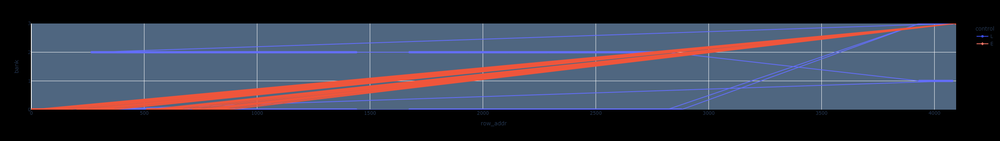

In [12]:
import plotly.express as px
interval =100000
vis_idx = 0
temp = df[vis_idx*interval:(vis_idx+1)*interval]

fig = px.line(temp, x='row_addr',y='bank', color='control',
		category_orders={'bank':[3,2,1,0]}, hover_data=['cycle'], symbol='control'
)
fig.update_xaxes(range=[0,4096])
fig.update_yaxes(range=[0,3])
fig.update_yaxes(type='category')
fig.show()


In [13]:
line = temp[temp.control=="E"].bank

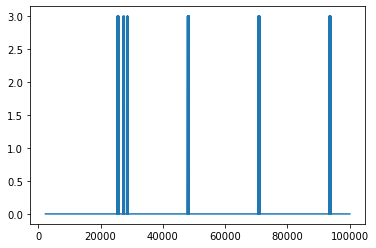

In [14]:
plt.plot(line)

In [15]:
df[df.control=='E']

,cycle,control,bank,row_addr
2306,3997378080,E,0,0
2307,3997378081,E,0,0
2309,3997378082,E,0,0
2311,3997378083,E,0,0
2313,3997378084,E,0,0
...,...,...,...,...
114555674,4264396329,E,0,35
114555675,4264396330,E,0,35
114555676,4264396331,E,0,35
114555677,4264396332,E,0,35


In [19]:
set(df[df.control=='L'].bank)

{0, 1, 2, 3}

In [16]:
set(df[df.control=='E'].bank)

{0, 3}

In [17]:
temp[np.logical_and(temp.control=='E', temp.bank==3)]

,cycle,control,bank,row_addr
25239,3997398673,E,3,4095
25240,3997398674,E,3,4095
25241,3997398675,E,3,4095
25242,3997398676,E,3,4095
25245,3997398679,E,3,4095
...,...,...,...,...
93874,3997460504,E,3,4095
93875,3997460505,E,3,4095
93882,3997460512,E,3,4095
93885,3997460515,E,3,4095
